In [1]:
import os
import numpy as np
import pandas as pd
from os import path
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import re
import matplotlib.pyplot as plt

from matplotlib import rcParams
rcParams["font.family"] = 'Dejavu Sans'

from konlpy.tag import Komoran
komoran = Komoran()

In [23]:
data_raw = pd.read_pickle('kh_whole.pkl')
data_raw.head()

,date,title,body
0,2013.02.20,"[사설]재벌 오너 등기이사 퇴진, 책임경영 회피 아닌가",정용진 신세계 부회장이 신세계와 이마트 등기이사에서 물러난다. 2010년 3월 등기...
1,2013.02.20,[사설]고위공직의 회전문 고리 이제는 끊어야 한다,‘박근혜 정부’의 출범을 앞두고 회전문 인사의 속살이 다시 벗겨졌다. 퇴직한 고위공...
2,2013.02.21,[사설]우려스러운 박 당선인의 노사문제 인식,박근혜 당선인이 그제 한국경영자총협회를 방문해 “노사자율의 원칙을 최대한 존중하겠다...
3,2013.02.21,[사설]경제민주화 후퇴는 국민과의 약속위반이다,"대통령직인수위원회가 어제 발표한 ‘박근혜 정부 5대 국정목표, 21개 국정전략, 1..."
4,2013.02.22,"[사설]기초연금, 아직 가야 할 길 멀다",박근혜 정부를 탄생시킨 핵심 복지공약 가운데 하나이자 ‘공약 후퇴’ 등의 논란을 빚...


In [24]:
data_raw_v2 = pd.read_pickle('kh_start.pkl')
data_raw_v2.tail(10)

,date,title,body
94,2013.02.17,[사설]‘절차·탕평 무시한 조각’ 일방통행의 전조인가,박근혜 대통령 당선인이 어제 경제부총리 겸 기획재정부 장관에 현오석 한국개발연구원(...
95,2013.02.18,[사설]경제민주화 의지 의심스러운 새 정부 경제팀,새 정부 경제팀 수장인 경제부총리 겸 기획재정부 장관에 경제기획원 국장 출신의 현오...
96,2013.02.18,[사설]박 당선인만 보이는 청와대·정부 ‘판박이’ 인사,‘박근혜 청와대’가 윤곽을 드러냈다. 초대 비서실장에는 친박근혜(친박)계 핵심인 허...
97,2013.02.19,"[사설]여성대통령 시대, 여성은 없다",중앙선거관리위원회가 최근 공개한 ‘18대 대선 투표율 분석 결과’는 흥미로운 내용을...
98,2013.02.20,"[사설]재벌 오너 등기이사 퇴진, 책임경영 회피 아닌가",정용진 신세계 부회장이 신세계와 이마트 등기이사에서 물러난다. 2010년 3월 등기...
99,2013.02.20,[사설]고위공직의 회전문 고리 이제는 끊어야 한다,‘박근혜 정부’의 출범을 앞두고 회전문 인사의 속살이 다시 벗겨졌다. 퇴직한 고위공...
101,2013.02.21,[사설]우려스러운 박 당선인의 노사문제 인식,박근혜 당선인이 그제 한국경영자총협회를 방문해 “노사자율의 원칙을 최대한 존중하겠다...
102,2013.02.21,[사설]경제민주화 후퇴는 국민과의 약속위반이다,"대통령직인수위원회가 어제 발표한 ‘박근혜 정부 5대 국정목표, 21개 국정전략, 1..."
103,2013.02.22,[사설]‘다케시마의 날’ 격상시킨 아베 내각의 패착,아베 신조 일본 내각이 어제 기어코 시마네현 ‘다케시마(독도)의 날’ 행사에 차관급...
104,2013.02.22,[사설]새 정부는 검찰 개혁할 의지가 있기는 한가,국민적 관심사였던 검찰 개혁이 빈껍데기만 남긴 채 흐지부지될 공산이 커졌다. 대통령...


In [29]:
data_raw_v2 = data_raw_v2.loc[:97]
data_raw_v2.tail()

,date,title,body
93,2013.02.22,"[사설]기초연금, 아직 가야 할 길 멀다",박근혜 정부를 탄생시킨 핵심 복지공약 가운데 하나이자 ‘공약 후퇴’ 등의 논란을 빚...
94,2013.02.17,[사설]‘절차·탕평 무시한 조각’ 일방통행의 전조인가,박근혜 대통령 당선인이 어제 경제부총리 겸 기획재정부 장관에 현오석 한국개발연구원(...
95,2013.02.18,[사설]경제민주화 의지 의심스러운 새 정부 경제팀,새 정부 경제팀 수장인 경제부총리 겸 기획재정부 장관에 경제기획원 국장 출신의 현오...
96,2013.02.18,[사설]박 당선인만 보이는 청와대·정부 ‘판박이’ 인사,‘박근혜 청와대’가 윤곽을 드러냈다. 초대 비서실장에는 친박근혜(친박)계 핵심인 허...
97,2013.02.19,"[사설]여성대통령 시대, 여성은 없다",중앙선거관리위원회가 최근 공개한 ‘18대 대선 투표율 분석 결과’는 흥미로운 내용을...


In [40]:
data_sample = pd.concat([data_raw_v2, data_raw])
data_sample.reset_index(inplace=True, drop=True)
data_sample.iloc[85:95, :]

,date,title,body
85,2013.02.15,[사설]무엇을 위한 핵무장론인가,북한의 3차 핵실험에 물리적 대응을 촉구하는 목소리가 도를 넘고 있다. 황우여 새누...
86,2013.02.22,"[사설]기초연금, 아직 가야 할 길 멀다",박근혜 정부를 탄생시킨 핵심 복지공약 가운데 하나이자 ‘공약 후퇴’ 등의 논란을 빚...
87,2013.02.17,[사설]‘절차·탕평 무시한 조각’ 일방통행의 전조인가,박근혜 대통령 당선인이 어제 경제부총리 겸 기획재정부 장관에 현오석 한국개발연구원(...
88,2013.02.18,[사설]경제민주화 의지 의심스러운 새 정부 경제팀,새 정부 경제팀 수장인 경제부총리 겸 기획재정부 장관에 경제기획원 국장 출신의 현오...
89,2013.02.18,[사설]박 당선인만 보이는 청와대·정부 ‘판박이’ 인사,‘박근혜 청와대’가 윤곽을 드러냈다. 초대 비서실장에는 친박근혜(친박)계 핵심인 허...
90,2013.02.19,"[사설]여성대통령 시대, 여성은 없다",중앙선거관리위원회가 최근 공개한 ‘18대 대선 투표율 분석 결과’는 흥미로운 내용을...
91,2013.02.20,"[사설]재벌 오너 등기이사 퇴진, 책임경영 회피 아닌가",정용진 신세계 부회장이 신세계와 이마트 등기이사에서 물러난다. 2010년 3월 등기...
92,2013.02.20,[사설]고위공직의 회전문 고리 이제는 끊어야 한다,‘박근혜 정부’의 출범을 앞두고 회전문 인사의 속살이 다시 벗겨졌다. 퇴직한 고위공...
93,2013.02.21,[사설]우려스러운 박 당선인의 노사문제 인식,박근혜 당선인이 그제 한국경영자총협회를 방문해 “노사자율의 원칙을 최대한 존중하겠다...
94,2013.02.21,[사설]경제민주화 후퇴는 국민과의 약속위반이다,"대통령직인수위원회가 어제 발표한 ‘박근혜 정부 5대 국정목표, 21개 국정전략, 1..."


In [41]:
data_sample.to_pickle('kh_whole_v2.pkl')

### data merged(month)

In [43]:
data_raw = pd.read_pickle('kh_whole_v2.pkl')

In [44]:
data_revise = data_raw.copy()
data_revise.date = data_revise.date.apply(lambda x : x[:7])
data_revise.head()

,date,title,body
0,2012.12,[사설]박근혜 대통령 당선자의 과제,제18대 대통령에 새누리당 박근혜 후보가 당선됐다. 헌정 사상 최초의 여성 대통령 ...
1,2012.12,"[사설]박 당선인, ‘대탕평 구상’ 인수위부터 실천해야",박근혜 대통령 당선인이 첫 행보로 현충원을 찾아 ‘새로운 변화와 개혁의 시대를 열겠...
2,2012.12,"[사설]민주당, 처절한 자기반성이 먼저다",대선에서 패한 민주통합당이 깊은 침묵과 혼돈에 빠져들었다. 정권교체 여론이 60%에...
3,2012.12,[사설]‘탕평’은 교육정책에도 필요하다,거듭 강조하지만 교육은 이념이나 정치를 떠나 그 자체의 논리에 충실해야 한다. 그제...
4,2012.12,[사설]북한 자극 방관하면서 어떻게 대화국면 여나,국방부가 엊그제 서부전선 최전방 애기봉의 등탑 점등을 허용한 것은 사려깊지 못한 처...


In [46]:
month = np.unique(data_revise.date)
data_merged = pd.DataFrame(columns=['date', 'title', 'body'])

for dates in month:

    # data revise에서 샘플링
    sample = data_revise[data_revise.date == dates]

    titles = sample.title.values
    titles = list(titles)
    titles = ''.join(titles)
    
    articles = sample.body.values
    articles = list(articles)
    articles = ''.join(articles)

    data = {
        "date" : dates,
        "title" : titles,
        "body" : articles
    }
    
    data_merged.loc[len(data_merged)] = data
    
data_merged.to_pickle('kh_data_merged_v2.pkl')

In [47]:
data_raw = pd.read_pickle('kh_data_merged_v2.pkl')
data_raw.head()

,date,title,body
0,2012.12,"[사설]박근혜 대통령 당선자의 과제[사설]박 당선인, ‘대탕평 구상’ 인수위부터 실...",제18대 대통령에 새누리당 박근혜 후보가 당선됐다. 헌정 사상 최초의 여성 대통령 ...
1,2013.01,[사설]경제에 방점 찍은 김정은 신년사[사설]희망버스가 다시 떠나야 하는 현실[사설...,김정은 북한 국방위원회 제1위원장이 어제 육성으로 발표한 신년사는 올해가 한반도 문...
2,2013.02,"[사설]만성질환 관리에 건강보험이 적극 나서야[사설]민주당, 좌·우가 아닌 아래로 ...",국책연구기관인 한국개발원(KDI)이 건강보험 정책의 초점을 기존의 일부 중증질환 보...
3,2013.03,[사설]구시대적인 물가정책으로는 물가 못 잡는다[사설]외교안보 ‘선군(先軍) 인사’...,손 놓고 있던 정부가 뒤늦게 물가를 잡겠다며 호들갑이다. 정부는 그제 관계부처 차관...
4,2013.04,"[사설]한은을 경기부양의 들러리로 세울 셈인가[사설]군 정신교육 강화, ‘유신군대’...",정부·여당의 ‘한은(韓銀) 흔들기’가 도를 넘었다. 현오석 경제부총리에 이어 새누리...


In [67]:
data_raw.body = data_raw.body.apply(lambda x : re.sub("\n", "", x))
data_raw.body[0][:1000]

'제18대 대통령에 새누리당 박근혜 후보가 당선됐다. 헌정 사상 최초의 여성 대통령 탄생이다. 범여권과 범야권, 보수와 진보가 각각 총결집해 명실상부한 양자대결을 벌인 이번 대선에서 박 후보가 승리한 것은 야당·진보 진영이 민생 대안 제시 측면에서 국민들에게 믿음을 주지 못한 결과라고 본다. 18대 대선은 ‘1987년 체제’에 대한 반성적 성찰의 시기에 치러진다는 점에서 각별한 주목을 받았다. 6월항쟁 이후 4반세기가 흐르는 동안 절차적 민주주의는 어느 정도 궤도에 올랐으나, 사회·경제적 민주주의는 요원한 상황이다. 국가는 살쪘음에도 중산층과 서민, 노인과 청년의 삶은 척박해진 아이러니가 경제민주화와 복지국가를 대선 이슈로 부상하게 했다. 새누리당과 박 당선자는 진보의 아젠다이던 경제민주화·복지국가론을 선점하면서 중도층에 다가섰다. 민주통합당과 문재인 후보는 박 후보 당선이 ‘이명박근혜’ 정권의 연장이라며 ‘정권교체’와 ‘새 정치’를 외쳤으나 역부족이었다. 당선의 영예를 안은 박 후보에게 축하를, 마지막까지 선전한 민주당 문 후보와 무소속 박종선·김소연·강지원·김순자 후보에게 위로를 보낸다.2007년 새누리당 대선 후보 경선에서 분루를 삼킨 박 당선자는 5년간의 절치부심 끝에 청와대 입성을 눈앞에 두게 됐다. 그러나 당선의 환희는 잠시일 것이다. 박 당선자를 둘러싼 대내외적 환경이 워낙 엄중한 까닭이다. 국제적으로는 한반도를 둘러싼 동북아시아의 정치지형이 심대한 변화를 예고하고 있다. 북한에서는 김정은 노동당 제1비서가 장거리 로켓 발사에 성공하는 등 ‘포스트 김정일 체제’를 안정적으로 구축해 나가는 상황이다. 일본에서는 극우파 아베 신조가 이끄는 자민당 정권의 등장이 동북아 정세에 높은 파고를 예고하고 있다. 중국 역시 시진핑 공산당 총서기 중심의 새 지도부가 출범하면서 외교노선의 변화 여부가 주목되는 상황이다. 새누리당은 전통적으로 한·미동맹을 중시하며 북한에 대해 강경 입장을 표방해왔으나, 박 당선자는 이 같은 정책기조를 넘어 보다 정교하고 치밀한 균형외

In [68]:
data_raw.to_pickle('kh_data_merged_v3.pkl')

In [48]:
from konlpy.tag import Komoran

dicpath = '/Users/quartz/Dropbox/Heart-Signal-BlueHouse/userdic.txt'
komoran = Komoran(userdic=dicpath)

In [49]:
stopwords = ['것', '박', '년', '일', '수', '대', '인', '중', '데', '때', '명', 
             '팀', '등', '은', '씨', '측', '간', '위', '급', '록', '월', '형', 
             '국', '행', '게', '박근혜', '대통령', '청와대', '정부']

In [69]:
# new corpus

corpus = data_raw.body.values
corpus[0][:500]

'제18대 대통령에 새누리당 박근혜 후보가 당선됐다. 헌정 사상 최초의 여성 대통령 탄생이다. 범여권과 범야권, 보수와 진보가 각각 총결집해 명실상부한 양자대결을 벌인 이번 대선에서 박 후보가 승리한 것은 야당·진보 진영이 민생 대안 제시 측면에서 국민들에게 믿음을 주지 못한 결과라고 본다. 18대 대선은 ‘1987년 체제’에 대한 반성적 성찰의 시기에 치러진다는 점에서 각별한 주목을 받았다. 6월항쟁 이후 4반세기가 흐르는 동안 절차적 민주주의는 어느 정도 궤도에 올랐으나, 사회·경제적 민주주의는 요원한 상황이다. 국가는 살쪘음에도 중산층과 서민, 노인과 청년의 삶은 척박해진 아이러니가 경제민주화와 복지국가를 대선 이슈로 부상하게 했다. 새누리당과 박 당선자는 진보의 아젠다이던 경제민주화·복지국가론을 선점하면서 중도층에 다가섰다. 민주통합당과 문재인 후보는 박 후보 당선이 ‘이명박근혜’ 정권의 연장이라며 ‘정권교체’와 ‘새 정치’를 외쳤으나 역부족이었다. 당선의 영예를 안은 박 후보'

In [70]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vect = TfidfVectorizer(tokenizer=komoran.nouns, min_df=3, stop_words=stopwords).fit(corpus)



In [71]:
X_sparse = tfidf_vect.transform(corpus)
X_dense = X_sparse.todense()
X_dense_T = X_dense.T

# data_revise : term - tf-idf matrix
columns = tfidf_vect.get_feature_names()
index = list(data_raw.date.values)

data_revise = pd.DataFrame(data=X_dense_T, columns=index, index=columns)
data_revise = round(data_revise * 1000)
data_revise = data_revise.astype(np.int)

In [72]:
# text = ""

index = data_revise.index
columns = data_revise.columns
n_ = len(columns)

len(index), len(columns), data_revise.shape

data_revise_v2 = pd.DataFrame(index=[0])

for j in range(n_):

    period = columns[j]
    keywords = ""

    data_sample = data_revise[period].sort_values(ascending=False)
    n = len(data_sample)

    for i in range(n):
        sample_index = data_sample.index[i]
        sample_values = data_sample.values[i]

        sample_index += " "
        keywords += sample_index * sample_values

    data_revise_v2[period] = keywords
    
data_revise_v3 = pd.DataFrame(data=data_revise_v2.values.T, columns=['keywords'], index=data_revise_v2.columns)
data_revise_v3.head()

,keywords
2012.12,당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선...
2013.01,당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선...
2013.02,당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선인 당선...
2013.03,방송 방송 방송 방송 방송 방송 방송 방송 방송 방송 방송 방송 방송 방송 방송 방...
2013.04,공단 공단 공단 공단 공단 공단 공단 공단 공단 공단 공단 공단 공단 공단 공단 공...


In [73]:
data_revise_v3.to_pickle('kh_data_keywords_v1.pkl')

In [74]:
stopwords = ['것', '박', '년', '일', '수', '대', '인', '중', '데', '때', '명', 
             '팀', '등', '은', '씨', '측', '간', '위', '급', '록', '월', '형', 
             '국', '행', '게', '박근혜', '대통령', '청와대', '정부']

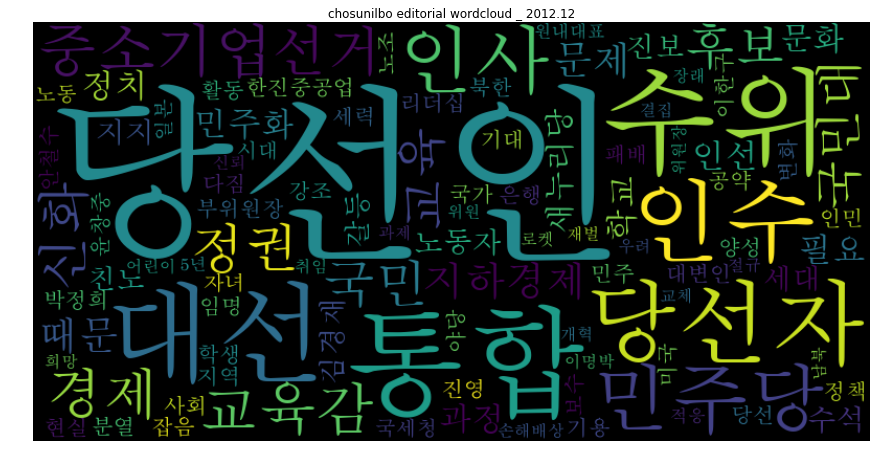

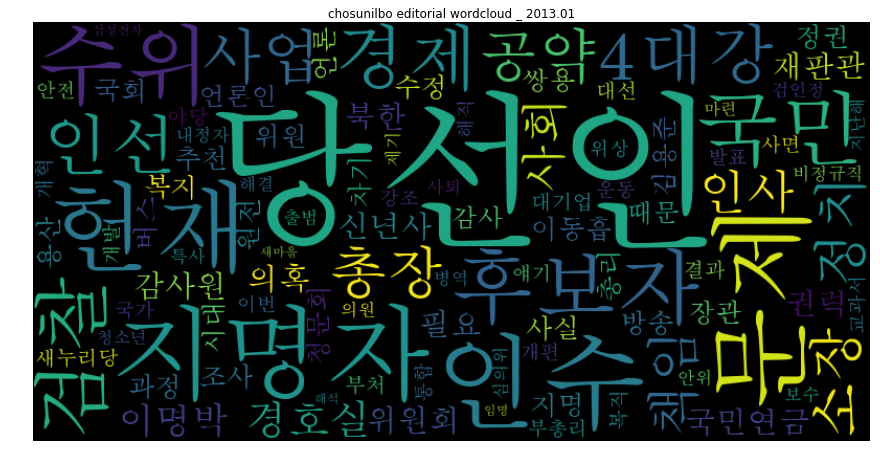

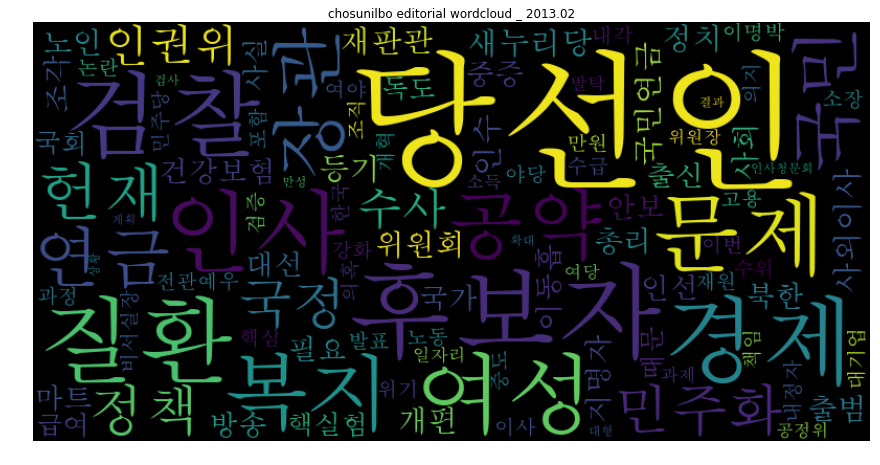

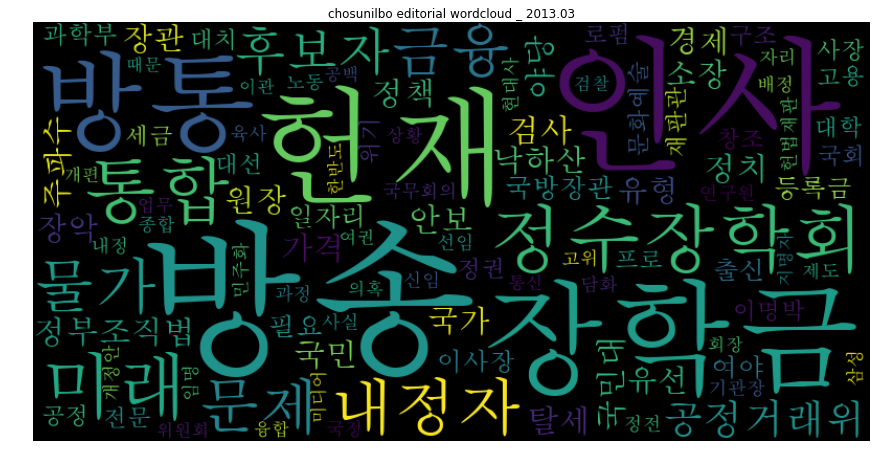

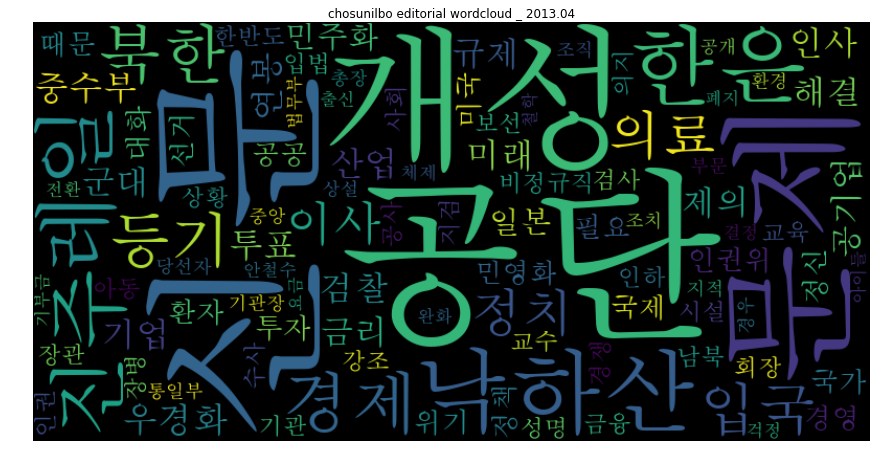

...

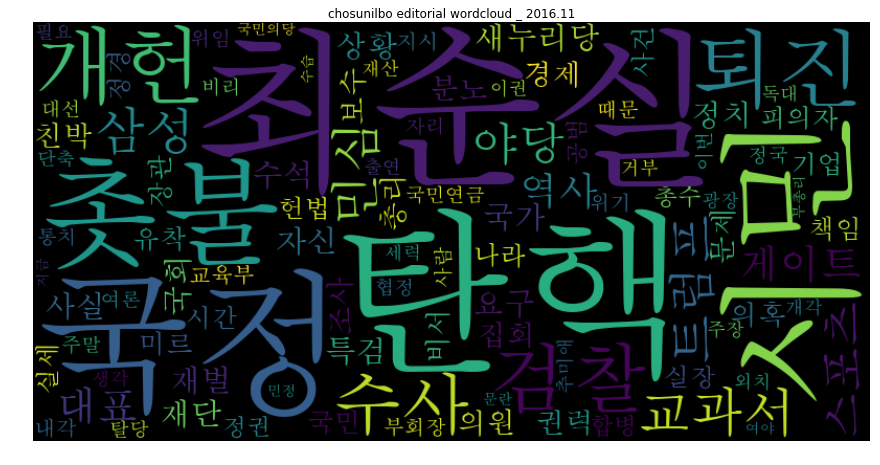

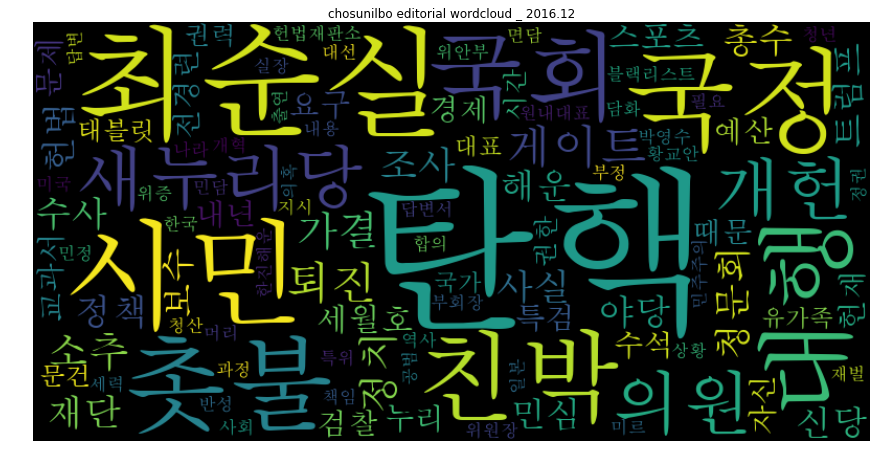

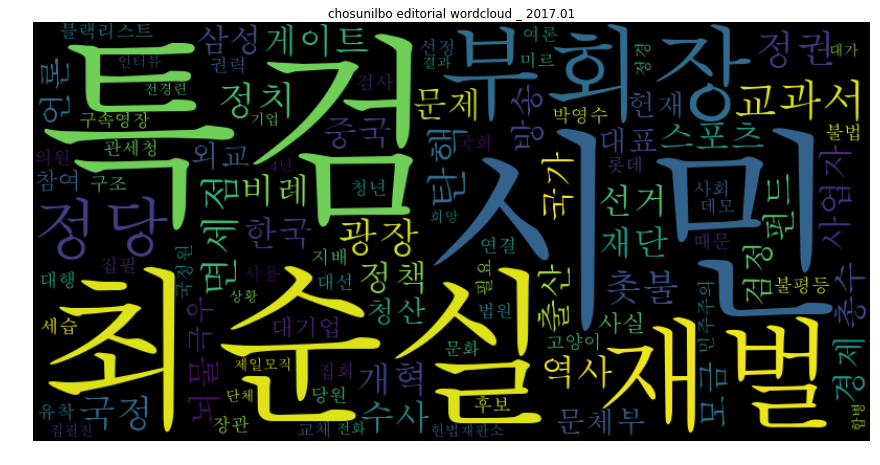

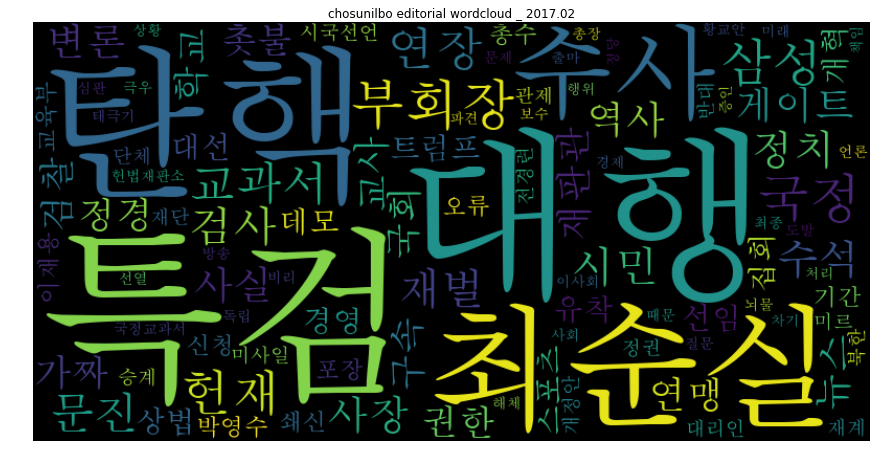

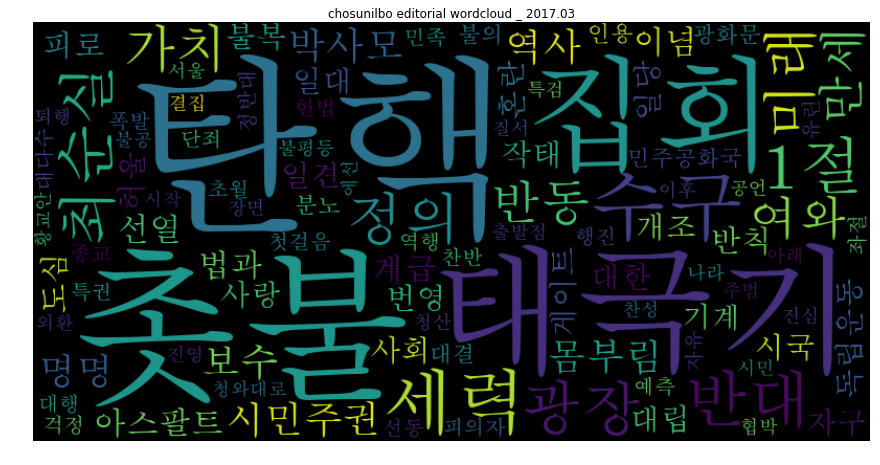

In [75]:
data = data_revise_v3.copy()
n = len(data)

for i in range(n):
    
    date = data.index[i]
    corpus = data.values[i][0]
    
    # Create and Generate a word cloud image:
    wc = WordCloud(width=800, height=400, max_font_size=None, collocations=False, 
                   stopwords=stopwords, max_words=100, font_path='/Library/Fonts/AppleMyungjo.ttf').generate(corpus)

    fig = plt.figure(figsize=(15, 10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("chosunilbo editorial wordcloud _ {}".format(date))
    plt.show()
    fig.savefig("/Users/quartz/data/editorial_analysis/kh/img_1/kyeonghyang_{}.png".format(date))